This notebook provides a brief overview of the main functionality of UrbanAccess with examples using Israel's MOT GTFS data and OpenStreetMap (OSM) pedestrian network data to create an integrated transit and pedestrian network for Tel Aviv District for use in Pandana network accessibility queries.

It is heavily based on a demo notebook from ** UrbanAccess on UDST:**  https://github.com/UDST/urbanaccess

**Notes:** 
- GTFS feeds are constantly updated. The feeds in this notebook may change over time which may result in slight differences in results.

## Installation:

For UrbanAccess installation instructions see: https://udst.github.io/urbanaccess/installation.html

This notebook contains optional Pandana examples which require the installation of Pandana, for instructions see here: http://udst.github.io/pandana/installation.html

Note that only Python 2.7 is available right now, and installing Fiona on windows is a bit of a hassle.

## Outline:

- The settings object
- The feeds object and searching for GTFS feeds
- Downloading GTFS data
- Loading GTFS data into a UrbanAccess transit data object
- Creating a transit network
- Downloading OSM data
- Creating a pedestrian network
- Creating an integrated transit and pedestrian network
- Saving a network to disk
- Loading a network from disk
- Visualizing the network
- Adding average headways to network travel time
- Using a UrbanAccess network with Pandana

In [136]:
import pandas as pd
import pandana as pdna
from pandana.loaders import osm
import time

import urbanaccess as ua
from urbanaccess.config import settings
from urbanaccess.gtfsfeeds import feeds
from urbanaccess import gtfsfeeds
from urbanaccess.gtfs.gtfsfeeds_dataframe import gtfsfeeds_dfs
from urbanaccess.network import ua_network, load_network

%matplotlib inline

In [137]:
# Pandana currently uses depreciated parameters in matplotlib, this hides the warning until its fixed
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

## The settings object

The `settings` object is a global `urbanaccess_config` object that can be used to set default options in UrbanAccess. In general, these options do not need to be changed.

In [138]:
settings.to_dict()

{'data_folder': 'data',
 'gtfs_api': {'gtfsdataexch': 'http://www.gtfs-data-exchange.com/api/agencies?format=csv'},
 'log_console': False,
 'log_file': True,
 'log_filename': 'urbanaccess',
 'log_name': 'urbanaccess',
 'logs_folder': 'logs'}

For example, you can stop printing in notebooks and only print to console by setting:

In [139]:
settings.log_console = True

## The feeds object

The GTFS `feeds` object is a global `urbanaccess_gtfsfeeds` object that allows you to save and manage information needed to download multiple GTFS feeds. This object is a dictionary of the names of GTFS feeds or agencies and the URLs to use to download the corresponding feeds.

In [144]:
feeds.to_dict()

{'gtfs_feeds': {}}

### Searching for GTFS feeds

You can use the search function to find feeds on the GTFS Data Exchange (Note: the GTFS Data Exchange is no longer being maintained as of Summer 2016 so feeds here may be out of date)

If you know of a GTFS feed located elsewhere or one that is more up to date, you can add additional feeds located at custom URLs by adding a dictionary with the key as the name of the service/agency and the value as the URL.

In [149]:
feeds.add_feed(add_dict={'israel': 'ftp://gtfs.mot.gov.il/israel-public-transportation.zip'})

Added 1 feeds to gtfs_feeds: {'israel': 'ftp://gtfs.mot.gov.il/israel-public-transportation.zip'}


Note the two GTFS feeds now in your feeds object ready to download

In [153]:
feeds.to_dict()

{'gtfs_feeds': {'israel': 'ftp://gtfs.mot.gov.il/israel-public-transportation.zip'}}

# Downloading GTFS data

Use the download function to download all the feeds in your feeds object at once. If no parameters are specified the existing feeds object will be used to acquire the data.

By default, your data will be downloaded into the directory of this notebook in the folder: `data`

In [ ]:
gtfsfeeds.download()

# Load GTFS data into an UrbanAccess transit data object

Now that we have downloaded our data let's load our individual GTFS feeds (currently a series of text files stored on disk) into a combined network of Pandas DataFrames.

- You can specify one feed or multiple feeds that are inside a root folder using the `gtfsfeed_path` parameter. If you want to aggregate multiple transit networks together, all the GTFS feeds you want to aggregate must be inside of a single root folder.
- Turn on `validation` and set a bounding box with the `remove_stops_outsidebbox` parameter turned on to ensure all your GTFS feed data are within a specified area.

Let's specify a bounding box of coordinates for Tel Aviv District to subset the GTFS data to. You can generate a bounding box by going to http://boundingbox.klokantech.com/ and selecting the CSV format.

In [ ]:
validation = True
verbose = True
# bbox for Tel Aviv District
bbox = (34.732918,31.988688,34.876007,32.202171)
remove_stops_outsidebbox = True
append_definitions = True

loaded_feeds = ua.gtfs.load.gtfsfeed_to_df(gtfsfeed_path=None,
                                           validation=validation,
                                           verbose=verbose,
                                           bbox=bbox,
                                           remove_stops_outsidebbox=remove_stops_outsidebbox,
                                           append_definitions=append_definitions)

### The transit data object

The output is a global `urbanaccess_gtfs_df` object that can be accessed with the specified variable `loaded_feeds`. This object holds all the individual GTFS feed files aggregated together with each GTFS feed file type in separate Pandas DataFrames to represent all the loaded transit feeds in a metropolitan area. 

In [156]:
loaded_feeds.stops.head()

,stop_id,unique_agency_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,location_type,parent_station,zone_id,unique_feed_id,route_type,location_type_desc
0,83,אגד,38913,משה שרת/יעקב קנר,רחוב:משה שרת 38 עיר: ראשון לציון רציף: קומה:,31.992306,34.756910,0,NaN,8300.0,israel_1,3.0,stop
1,91,אגד,38921,השר חיים שפירא/יוסף ספיר,רחוב:השר חיים משה שפירא 4 עיר: ראשון לציון רצ...,31.992583,34.751999,0,NaN,8300.0,israel_1,3.0,stop
2,92,אגד,38922,השר חיים שפירא/הרב שלום ג'רופי,רחוב:השר חיים משה שפירא 16 עיר: ראשון לציון ר...,31.990757,34.755683,0,NaN,8300.0,israel_1,3.0,stop
3,633,אגד,39558,כלנית/יסמין,רחוב:הכלנית 24 עיר: בית דגן רציף: קומה:,31.996307,34.828531,0,NaN,466.0,israel_1,3.0,stop
4,633,קווים,39558,כלנית/יסמין,רחוב:הכלנית 24 עיר: בית דגן רציף: קומה:,31.996307,34.828531,0,NaN,466.0,israel_1,3.0,stop


Note the two transit services we have aggregated into one regional table

Quickly view the transit stop locations

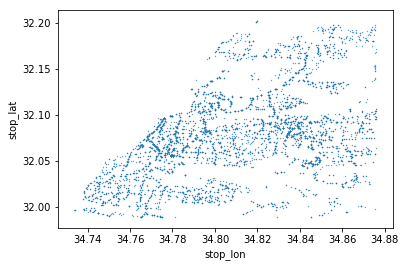

In [158]:
loaded_feeds.stops.plot(kind='scatter', x='stop_lon', y='stop_lat', s=0.1)

In [215]:
loaded_feeds.agencies.head()

AttributeError: 'urbanaccess_gtfs_df' object has no attribute 'agencies'

In [159]:
loaded_feeds.routes.head()

,route_id,agency_id,route_short_name,route_long_name,route_desc,route_type,route_color,unique_agency_id,unique_feed_id,route_type_desc
0,20515,2,NaN,לוד-לוד<->רחובות-רחובות,12119-1-4,2,NaN,רכבת_ישראל,israel_1,Rail: intercity or long-distance
1,22347,2,NaN,ראשונים-ראשון לציון<->לוד-לוד,13118-2-6,2,NaN,רכבת_ישראל,israel_1,Rail: intercity or long-distance
2,21054,2,NaN,כרמיאל-כרמיאל<->חוף הכרמל-חיפה,14122-1-1,2,NaN,רכבת_ישראל,israel_1,Rail: intercity or long-distance
3,21762,2,NaN,חדרה מערב-חדרה<->תל אביב ההגנה-תל אביב יפו,15121-1-2,2,NaN,רכבת_ישראל,israel_1,Rail: intercity or long-distance
4,21056,2,NaN,בית שמש-בית שמש<->ירושלים מלחה-ירושלים,15124-1-2,2,NaN,רכבת_ישראל,israel_1,Rail: intercity or long-distance


In [160]:
loaded_feeds.stop_times.head()

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,pickup_type,drop_off_type,shape_dist_traveled,unique_agency_id,unique_feed_id,route_type,pickup_type_desc,drop_off_type_desc,departure_time_sec
0,25418516_050418,23:01:00,23:01:00,37292,6,0.0,0.0,76100,רכבת_ישראל,israel_1,2,Regularly Scheduled,Regularly Scheduled,82860
1,25418516_050418,23:05:00,23:05:00,37350,7,0.0,0.0,78400,רכבת_ישראל,israel_1,2,Regularly Scheduled,Regularly Scheduled,83100
2,25418516_050418,23:09:00,23:09:00,37358,8,1.0,0.0,79800,רכבת_ישראל,israel_1,2,Not available,Regularly Scheduled,83340
3,25418516_140418,23:01:00,23:01:00,37292,6,0.0,0.0,76100,רכבת_ישראל,israel_1,2,Regularly Scheduled,Regularly Scheduled,82860
4,25418516_140418,23:05:00,23:05:00,37350,7,0.0,0.0,78400,רכבת_ישראל,israel_1,2,Regularly Scheduled,Regularly Scheduled,83100


In [161]:
loaded_feeds.trips.head()

,route_id,service_id,trip_id,trip_headsign,direction_id,shape_id,unique_agency_id,unique_feed_id
0,94,57991548,31328119_050418,תל אביב יפו _ מסוף רדינג,0,88328.0,אפיקים,israel_1
1,95,57991545,31328132_050418,אשדוד _ רובע טו-כיכר טופז,1,88326.0,אפיקים,israel_1
2,95,57991545,31328134_050418,אשדוד _ רובע טו-כיכר טופז,1,88326.0,אפיקים,israel_1
3,95,57991545,31328133_050418,אשדוד _ רובע טו-כיכר טופז,1,88326.0,אפיקים,israel_1
4,95,57991545,31328135_050418,אשדוד _ רובע טו-כיכר טופז,1,88326.0,אפיקים,israel_1


In [162]:
loaded_feeds.calendar.head()

,service_id,sunday,monday,tuesday,wednesday,thursday,friday,saturday,start_date,end_date,unique_agency_id,unique_feed_id
0,57996925,1,0,0,0,0,0,0,20180409,20180410,דן,israel_1
1,58002095,1,0,1,0,1,0,0,20180417,20180417,אגד,israel_1
2,58007330,0,0,0,0,0,0,1,20180407,20180407,אגד,israel_1
3,58013600,0,0,0,0,0,1,0,20180407,20180531,גי.בי.טורס,israel_1
4,58018615,0,0,0,0,0,1,0,20180413,20180414,אגד,israel_1


# Create a transit network

Now that we have loaded and standardized our GTFS data, let's create a travel time weighted graph from the GTFS feeds we have loaded.

Create a network for weekday `monday` service between 7 am and 10 am (`['07:00:00', '10:00:00']`) to represent travel times during the AM Peak period.

Assumptions: We are using the service ids in the `calendar` file to subset the day of week, however if your feed uses the `calendar_dates` file and not the `calendar` file then you can use the `calendar_dates_lookup` parameter. This is not required for AC Transit and BART.

In [ ]:
ua.gtfs.network.create_transit_net(gtfsfeeds_dfs=loaded_feeds,
                                   day='monday',
                                   timerange=['07:00:00', '10:00:00'],
                                   calendar_dates_lookup=None)

### The UrbanAccess network object

The output is a global `urbanaccess_network` object. This object holds the resulting graph comprised of nodes and edges for the processed GTFS network data for services operating at the day and time you specified inside of `transit_edges` and `transit_nodes`.

Let's set the global network object to a variable called `urbanaccess_net` that we can then inspect:

In [164]:
urbanaccess_net = ua.network.ua_network

In [165]:
urbanaccess_net.transit_edges.head()

,node_id_from,node_id_to,unique_agency_id,unique_trip_id,weight,sequence,id,route_type,unique_route_id,net_type
0,12975_קווים,13355_קווים,קווים,10408971_010418_קווים,4.100000,1,10408971_010418_קווים_1,3,11338_קווים,transit
1,13355_קווים,12952_קווים,קווים,10408971_010418_קווים,3.583333,2,10408971_010418_קווים_2,3,11338_קווים,transit
2,12952_קווים,39962_קווים,קווים,10408971_010418_קווים,1.366667,3,10408971_010418_קווים_3,3,11338_קווים,transit
3,39962_קווים,29322_קווים,קווים,10408971_010418_קווים,1.750000,4,10408971_010418_קווים_4,3,11338_קווים,transit
4,29322_קווים,12932_קווים,קווים,10408971_010418_קווים,1.866667,5,10408971_010418_קווים_5,3,11338_קווים,transit


In [166]:
urbanaccess_net.transit_nodes.head()

,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,zone_id,location_type,net_type
node_id,,,,,,,,,,,
83_אגד,34.756910,31.992306,אגד,3.0,83,משה שרת/יעקב קנר,NaN,38913,8300.0,0,transit
91_אגד,34.751999,31.992583,אגד,3.0,91,השר חיים שפירא/יוסף ספיר,NaN,38921,8300.0,0,transit
92_אגד,34.755683,31.990757,אגד,3.0,92,השר חיים שפירא/הרב שלום ג'רופי,NaN,38922,8300.0,0,transit
633_אגד,34.828531,31.996307,אגד,3.0,633,כלנית/יסמין,NaN,39558,466.0,0,transit
633_קווים,34.828531,31.996307,קווים,3.0,633,כלנית/יסמין,NaN,39558,466.0,0,transit


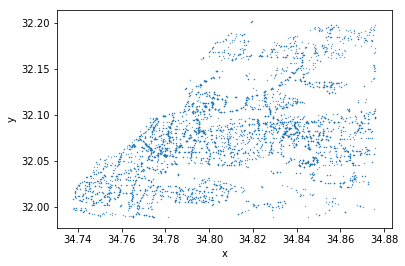

In [167]:
urbanaccess_net.transit_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# Download OSM data

Now let's download OpenStreetMap (OSM) pedestrian street network data to produce a graph network of nodes and edges for Tel Aviv District. We will use the same bounding box as before.

In [168]:
nodes, edges = ua.osm.load.ua_network_from_bbox(bbox=bbox,
                                                remove_lcn=True)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](31.98868800,34.73291800,32.20217100,34.87600700);>;);out;'}"
Downloaded 16,131.7KB from www.overpass-api.de in 5.92 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 7.03 seconds
Returning OSM data with 103,506 nodes and 26,246 ways...
Edge node pairs completed. Took 63.43 seconds
Returning processed graph with 37,242 nodes and 110,510 edges...
Completed OSM data download and Pandana node and edge table creation in 75.72 seconds
checking for low connectivity nodes...
44 out of 37,242 nodes (0.12 percent of total) were identified as having low connectivity and have been removed.
Completed OSM data download and graph node and edge table creation

# Create a pedestrian network

Now that we have our pedestrian network data let's create a travel time weighted graph from the pedestrian network we have loaded and add it to our existing UrbanAccess network object. We will assume a pedestrian travels on average at 3 mph.

The resulting weighted network will be added to your UrbanAccess network object inside `osm_nodes` and `osm_edges`

In [169]:
ua.osm.network.create_osm_net(osm_edges=edges,
                              osm_nodes=nodes,
                              travel_speed_mph=3)

Created OSM network with travel time impedance using a travel speed of 3 MPH. Took 0.02 seconds


Let's inspect the results which we can access inside of the existing `urbanaccess_net` variable:

In [170]:
urbanaccess_net.osm_nodes.head()

,x,y,id,net_type
id,,,,
139693,34.790574,32.093846,139693,walk
139698,34.791232,32.093880,139698,walk
139699,34.785571,32.095481,139699,walk
139705,34.779959,32.095031,139705,walk
139707,34.778492,32.095357,139707,walk


In [171]:
urbanaccess_net.osm_edges.head()

access bridge    distance        from   highway lanes  \
3725505609 2469848101    NaN    NaN   13.390859  3725505609  tertiary   NaN   
2469848101 3725505609    NaN    NaN   13.390859  2469848101  tertiary   NaN   
           1184173362    NaN    NaN   12.821533  2469848101  tertiary   NaN   
1184173362 2469848101    NaN    NaN   12.821533  1184173362  tertiary   NaN   
           1684309906    NaN    NaN  131.044920  1184173362  tertiary   NaN   

                      maxspeed      name oneway  ref service          to  \
3725505609 2469848101      NaN  בן יהודה    yes  NaN     NaN  2469848101   
2469848101 3725505609      NaN  בן יהודה    yes  NaN     NaN  3725505609   
           1184173362      NaN  בן יהודה    yes  NaN     NaN  1184173362   
1184173362 2469848101      NaN  בן יהודה    yes  NaN     NaN  2469848101   
           1684309906      NaN  בן יהודה    yes  NaN     NaN  1684309906   

                      tunnel    weight net_type  
3725505609 2469848101    NaN  0.166414     walk  
2469848101 3725505609    NaN  0.166414     walk  
           1184173362    NaN  0.159339     walk  
1184173362 2469848101    NaN  0.159339     walk  
           1684309906    NaN  1.628555     walk

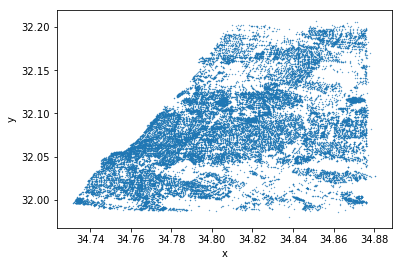

In [172]:
urbanaccess_net.osm_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# Create an integrated transit and pedestrian network

Now let's integrate the two networks together. The resulting graph will be added to your existing UrbanAccess network object. After running this step, your network will be ready to be used with Pandana.

The resulting integrated network will be added to your UrbanAccess network object inside `net_nodes` and `net_edges`

In [173]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=False)

Loaded UrbanAccess network components comprised of:
     Transit: 5,733 nodes and 487,238 edges;
     OSM: 37,198 nodes and 110,414 edges
Connector edges between the OSM and transit network nodes successfully completed. Took 2.93 seconds
Fixed unicode error in name column
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 6.34 seconds
Network edge and node network integration completed successfully resulting in a total of 42,931 nodes and 609,118 edges:
     Transit: 5,733 nodes 487,238 edges;
     OSM: 37,198 nodes 110,414 edges; and
     OSM/Transit connector: 11,466 edges.


Let's inspect the results which we can access inside of the existing `urbanaccess_net` variable:

In [174]:
urbanaccess_net.net_nodes.head()

,id,location_type,net_type,parent_station,route_type,stop_code,stop_id,stop_name,unique_agency_id,x,y,zone_id
id_int,,,,,,,,,,,,
1,83_אגד,0.0,transit,NaN,3.0,38913.0,83,משה שרת/יעקב קנר,אגד,34.756910,31.992306,8300.0
2,91_אגד,0.0,transit,NaN,3.0,38921.0,91,השר חיים שפירא/יוסף ספיר,אגד,34.751999,31.992583,8300.0
3,92_אגד,0.0,transit,NaN,3.0,38922.0,92,השר חיים שפירא/הרב שלום ג'רופי,אגד,34.755683,31.990757,8300.0
4,633_אגד,0.0,transit,NaN,3.0,39558.0,633,כלנית/יסמין,אגד,34.828531,31.996307,466.0
5,633_קווים,0.0,transit,NaN,3.0,39558.0,633,כלנית/יסמין,קווים,34.828531,31.996307,466.0


In [175]:
urbanaccess_net.net_edges.head()

,access,bridge,distance,from,highway,edge_id,lanes,maxspeed,name,net_type,...,sequence,service,to,tunnel,unique_agency_id,unique_route_id,unique_trip_id,weight,from_int,to_int
0,nan,nan,NaN,12975_קווים,nan,10408971_010418_קווים_1,nan,nan,NaN,transit,...,1.0,nan,13355_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,4.100000,412,1378
1,nan,nan,NaN,13355_קווים,nan,10408971_010418_קווים_2,nan,nan,NaN,transit,...,2.0,nan,12952_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,3.583333,1378,378
2,nan,nan,NaN,12952_קווים,nan,10408971_010418_קווים_3,nan,nan,NaN,transit,...,3.0,nan,39962_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.366667,378,5613
3,nan,nan,NaN,39962_קווים,nan,10408971_010418_קווים_4,nan,nan,NaN,transit,...,4.0,nan,29322_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.750000,5613,4949
4,nan,nan,NaN,29322_קווים,nan,10408971_010418_קווים_5,nan,nan,NaN,transit,...,5.0,nan,12932_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.866667,4949,333


In [176]:
urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type'] == 'transit'].head()

,access,bridge,distance,from,highway,edge_id,lanes,maxspeed,name,net_type,...,sequence,service,to,tunnel,unique_agency_id,unique_route_id,unique_trip_id,weight,from_int,to_int
0,nan,nan,NaN,12975_קווים,nan,10408971_010418_קווים_1,nan,nan,NaN,transit,...,1.0,nan,13355_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,4.100000,412,1378
1,nan,nan,NaN,13355_קווים,nan,10408971_010418_קווים_2,nan,nan,NaN,transit,...,2.0,nan,12952_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,3.583333,1378,378
2,nan,nan,NaN,12952_קווים,nan,10408971_010418_קווים_3,nan,nan,NaN,transit,...,3.0,nan,39962_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.366667,378,5613
3,nan,nan,NaN,39962_קווים,nan,10408971_010418_קווים_4,nan,nan,NaN,transit,...,4.0,nan,29322_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.750000,5613,4949
4,nan,nan,NaN,29322_קווים,nan,10408971_010418_קווים_5,nan,nan,NaN,transit,...,5.0,nan,12932_קווים,nan,קווים,11338_קווים,10408971_010418_קווים,1.866667,4949,333


# Save the network to disk

You can save the final processed integrated network `net_nodes` and `net_edges` to disk inside of a HDF5 file. By default the file will be saved to the directory of this notebook in the folder `data`

In [177]:
ua.network.save_network(urbanaccess_network=urbanaccess_net,
                        filename='final_net.h5',
                        overwrite_key = True)

Using existing data/final_net.h5 hdf5 store.
Existing edges overwritten in data/final_net.h5 hdf5 store.
Using existing data/final_net.h5 hdf5 store.
Existing nodes overwritten in data/final_net.h5 hdf5 store.


# Load saved network from disk

You can load an existing processed integrated network HDF5 file from disk into a UrbanAccess network object.

In [178]:
urbanaccess_net = ua.network.load_network(filename='final_net.h5')

Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']
Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']


# Visualize the network

You can visualize the network you just created using basic UrbanAccess plot functions

### Integrated network

Figure created. Took 87.65 seconds


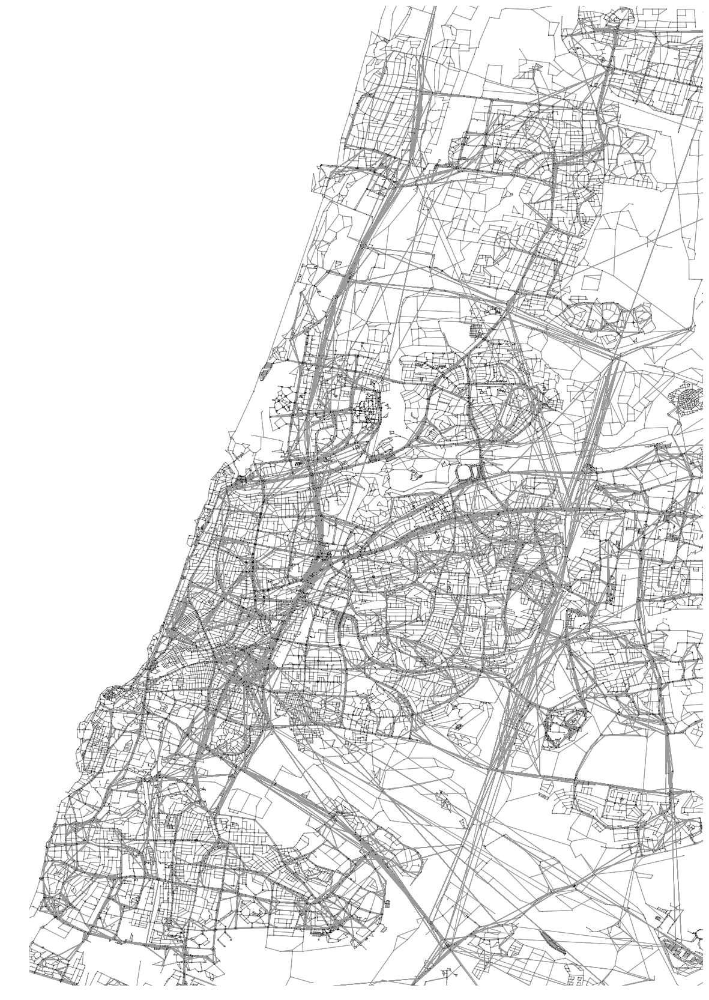

(<Figure size 1447.76x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x229355438>)

In [179]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=1.1, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

### Integrated network by travel time

Use the `col_colors` function to color edges by travel time. In this case the darker red the higher the travel times.

Figure created. Took 100.05 seconds


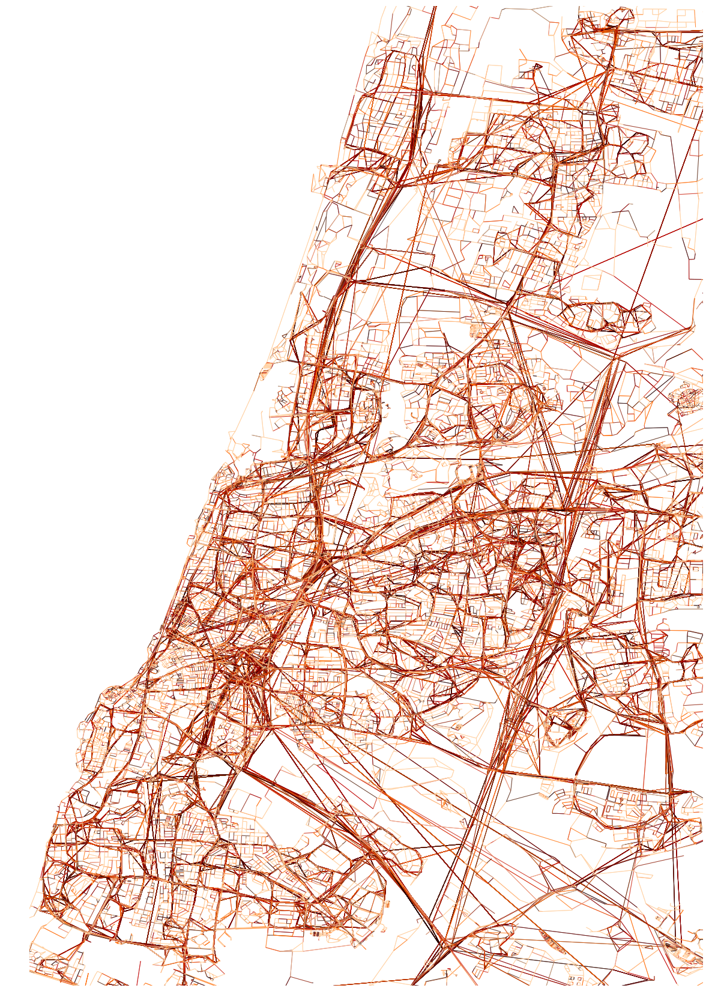

(<Figure size 1447.76x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x20f4d1438>)

In [180]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Let's zoom in closer to downtown Tel-Aviv-Yafo using a new smaller extent bbox. 

Figure created. Took 99.15 seconds


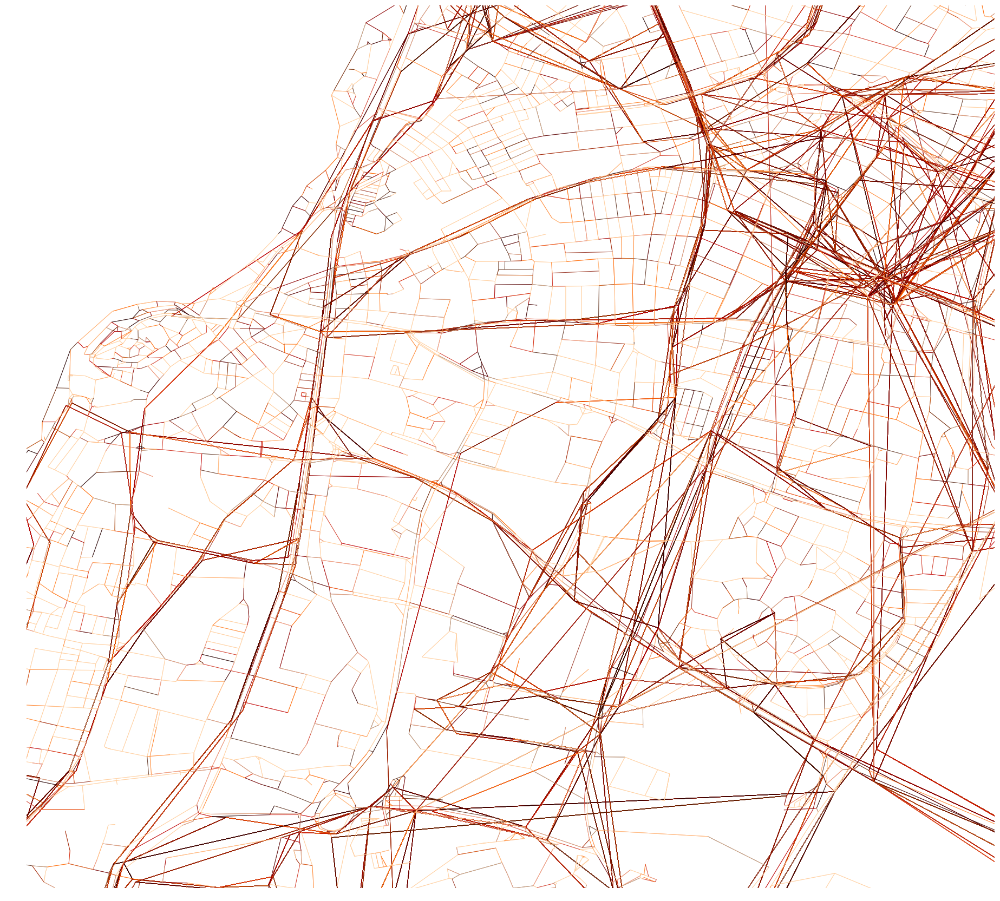

(<Figure size 2306.64x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x22915a630>)

In [181]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=(34.747867,32.032876,34.784817,32.067477),
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

### Transit network

You can also slice the network by network type

Figure created. Took 73.79 seconds


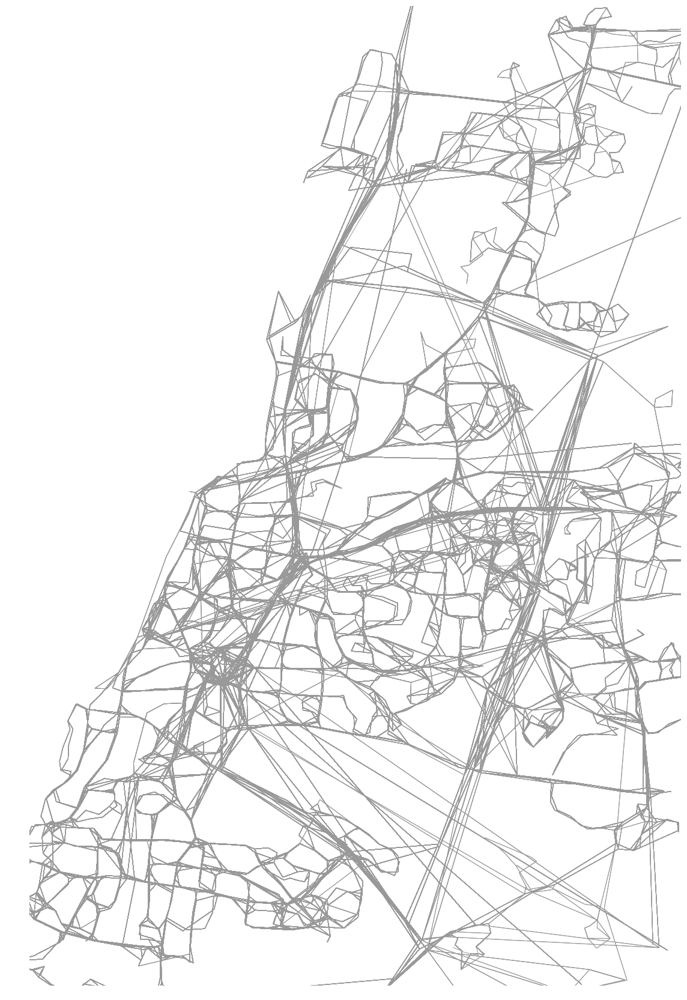

(<Figure size 1399.35x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x2ffc4a908>)

In [182]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='transit'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

### Pedestrian network

Figure created. Took 18.95 seconds


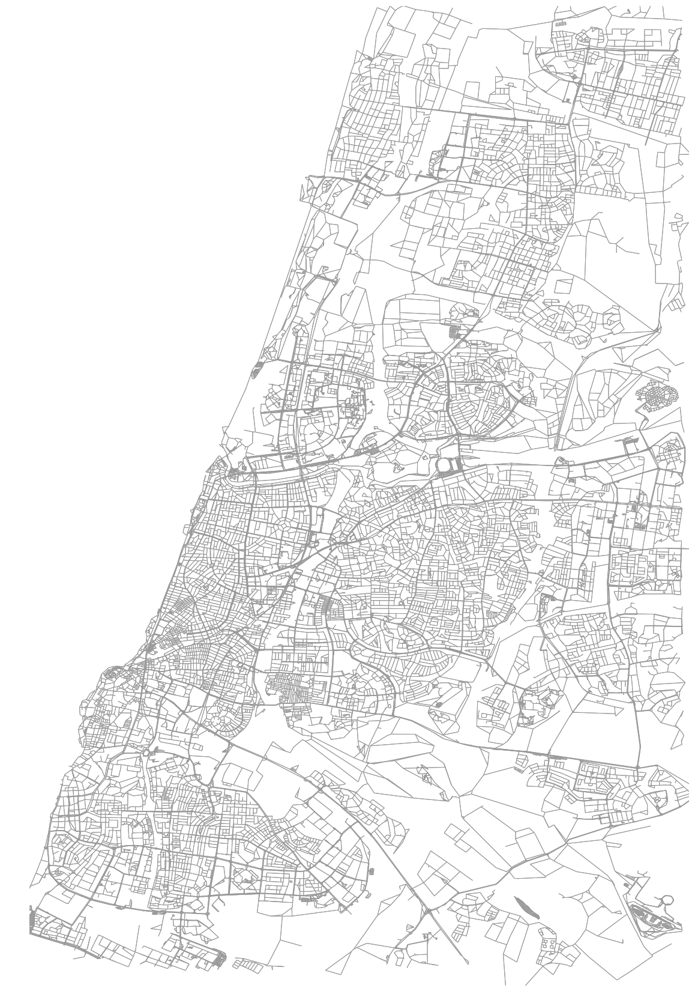

(<Figure size 1418.14x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x35aebb0f0>)

In [183]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='walk'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# Using an UrbanAccess network with Pandana

Pandana (Pandas Network Analysis) is a tool to compute network accessibility metrics.

Now that we have an integrated transit and pedestrian network that has been formatted for use with Pandana, we can now use Pandana right away to compute accessibility metrics.

There are a couple of things to remember about UrbanAccess and Pandana:
- UrbanAccess generates by default a one way network. One way means there is an explicit edge for each direction in the edge table. Where applicable, it is important to set any Pandana `two_way` parameters to `False` (they are `True` by default) to indicate that the network is a one way network.
- As of Pandana v0.3.0, `node ids` and `from` and `to` columns in your network must be integer type and not string. UrbanAccess automatically generates both string and integer types so use the `from_int` and `to_int` columns in edges and the index in nodes `id_int`.
- UrbanAccess by default will generate edge weights that represent travel time in units of minutes.

For more on Pandana see the:

**Pandana repo:** https://github.com/UDST/pandana 

**Pandana documentation:** http://udst.github.io/pandana/

## Initialize the Pandana network

Let's initialize our Pandana network object using our transit and pedestrian network we created. Note: the `from_int` and `to_int` as well as the `twoway=False` denoting this is a explicit one way network.

In [184]:
s_time = time.time()
transit_ped_net = pdna.Network(urbanaccess_net.net_nodes["x"],
                               urbanaccess_net.net_nodes["y"],
                               urbanaccess_net.net_edges["from_int"],
                               urbanaccess_net.net_edges["to_int"],
                               urbanaccess_net.net_edges[["weight"]], 
                               twoway=False)
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 44.44 seconds


## Amenity accessibility

In [185]:
# configure search at a max distance of 1 km for up to the 10 nearest points-of-interest
amenities = ['restaurant', 'bar', 'pub', 'ice_cream', 'cafe', 'food_court',
             'cinema', 'arts_centre', 'community_centre', 'nightclub', 'social_centre', 'studio', 'theatre',
             'school', 'college', 'kindergarten', 'library', 'university',
             'atm', 'bank',
             'clinic', 'dentist', 'doctors', 'hospital', 'pharmacy', 'veterinary']
distance = 1000
num_pois = 10
num_categories = len(amenities) + 1 #one for each amenity, plus one extra for all of them combined

pandana_bbox = (31.988688, 34.732918, 32.202171, 34.876007)


In [186]:
# configure filenames to save/load POI and network datasets
bbox_string = '_'.join([str(x) for x in pandana_bbox])
net_filename = 'data/network_{}.h5'.format(bbox_string)
poi_filename = 'data/pois_{}_{}.csv'.format(''.join([a[0] for a in amenities]), bbox_string)
poi_filename

'data/pois_rbpicfcacnsstsckluabcddhpv_31.988688_34.732918_32.202171_34.876007.csv'

In [187]:
# keyword arguments to pass for the matplotlib figure
bbox_aspect_ratio = (pandana_bbox[2] - pandana_bbox[0]) / (pandana_bbox[3] - pandana_bbox[1])
fig_kwargs = {'facecolor':'w', 
              'figsize':(10, 10 * bbox_aspect_ratio)}

# keyword arguments to pass for scatter plots
plot_kwargs = {'s':5, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}

# network aggregation plots are the same as regular scatter plots, but without a reversed colormap
agg_plot_kwargs = plot_kwargs.copy()
agg_plot_kwargs['cmap'] = 'viridis'

# keyword arguments to pass for hex bin plots
hex_plot_kwargs = {'gridsize':60,
                   'alpha':0.9, 
                   'cmap':'viridis_r', 
                   'edgecolor':'none'}

# keyword arguments to pass to make the colorbar
cbar_kwargs = {}

# keyword arguments to pass to basemap
bmap_kwargs = {}

# color to make the background of the axis
bgcolor = 'k'

### Download points of interest (POIs) and network data from OSM

First get the points of interest - either load an existing set for the specified amenities and bounding box from CSV, or get it from the OSM API.

In [188]:
import os
start_time = time.time()
if os.path.isfile(poi_filename):
    # if a points-of-interest file already exists, just load the dataset from that
    pois = pd.read_csv(poi_filename)
    method = 'loaded from CSV'
else:   
    # otherwise, query the OSM API for the specified amenities within the bounding box 
    osm_tags = '"amenity"~"{}"'.format('|'.join(amenities))
    pois = osm.node_query(pandana_bbox[0], pandana_bbox[1], pandana_bbox[2], pandana_bbox[3], tags=osm_tags)
    
    # using the '"amenity"~"school"' returns preschools etc, so drop any that aren't just 'school' then save to CSV
    pois = pois[pois['amenity'].isin(amenities)]
    pois.to_csv(poi_filename, index=False, encoding='utf-8')
    method = 'downloaded from OSM'
    
print('{:,} POIs {} in {:,.2f} seconds'.format(len(pois), method, time.time()-start_time))
pois[['amenity', 'name', 'lat', 'lon']].head()

1,473 POIs loaded from CSV in 0.16 seconds


,amenity,name,lat,lon
0,school,סמדר,32.168618,34.803042
1,cinema,סינמה סיטי גלילות,32.146460,34.804616
2,pharmacy,ניו-פארם,32.185967,34.854567
3,pharmacy,סופר-פארם,32.184337,34.853264
4,cinema,סינמה פארק רעננה,32.184080,34.853144


In [189]:
# how many points of interest of each type of amenity did we retrieve?
pois['amenity'].value_counts()

restaurant          394
cafe                311
bank                151
pharmacy             88
atm                  78
bar                  71
pub                  70
school               64
kindergarten         59
clinic               42
veterinary           23
ice_cream            20
theatre              18
nightclub            16
library              16
cinema               16
community_centre      9
dentist               7
hospital              6
doctors               5
college               3
arts_centre           3
university            2
studio                1
Name: amenity, dtype: int64

In [190]:
pois['node_id'] = transit_ped_net.get_node_ids(pois['lon'], pois['lat'])

In [191]:
pois['node_id'].nunique()

1185

In [192]:
pois[['node_id', 'amenity', 'name', 'lat', 'lon']].head()

,node_id,amenity,name,lat,lon
0,2500,school,סמדר,32.168618,34.803042
1,38567,cinema,סינמה סיטי גלילות,32.146460,34.804616
2,9167,pharmacy,ניו-פארם,32.185967,34.854567
3,7053,pharmacy,סופר-פארם,32.184337,34.853264
4,7053,cinema,סינמה פארק רעננה,32.184080,34.853144


In [193]:
pois_gr = pois.groupby('node_id').size().reset_index()

In [194]:
pois_gr.loc[:,0].sum()

1473

In [195]:
transit_ped_net.set(pois_gr.node_id, variable = pois_gr.loc[:,0], name='amens')

In [196]:
s_time = time.time()
amens_45 = transit_ped_net.aggregate(45, type='sum', decay='linear', name='amens')
amens_30 = transit_ped_net.aggregate(30, type='sum', decay='linear', name='amens')
amens_15 = transit_ped_net.aggregate(15, type='sum', decay='linear', name='amens')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 571.98 seconds


In [197]:
print amens_45.head()
print amens_30.head()
print amens_15.head()

id_int
1    250.257584
2    270.726562
3    235.326157
4    561.709778
5    556.112854
dtype: float32
id_int
1     70.206131
2     67.725998
3     62.651600
4    191.929901
5    186.163040
dtype: float32
id_int
1    10.052333
2     6.434667
3     8.791800
4     3.626267
5     3.388667
dtype: float32


### Amenities accessible within 15 minutes

Took 11.10 seconds


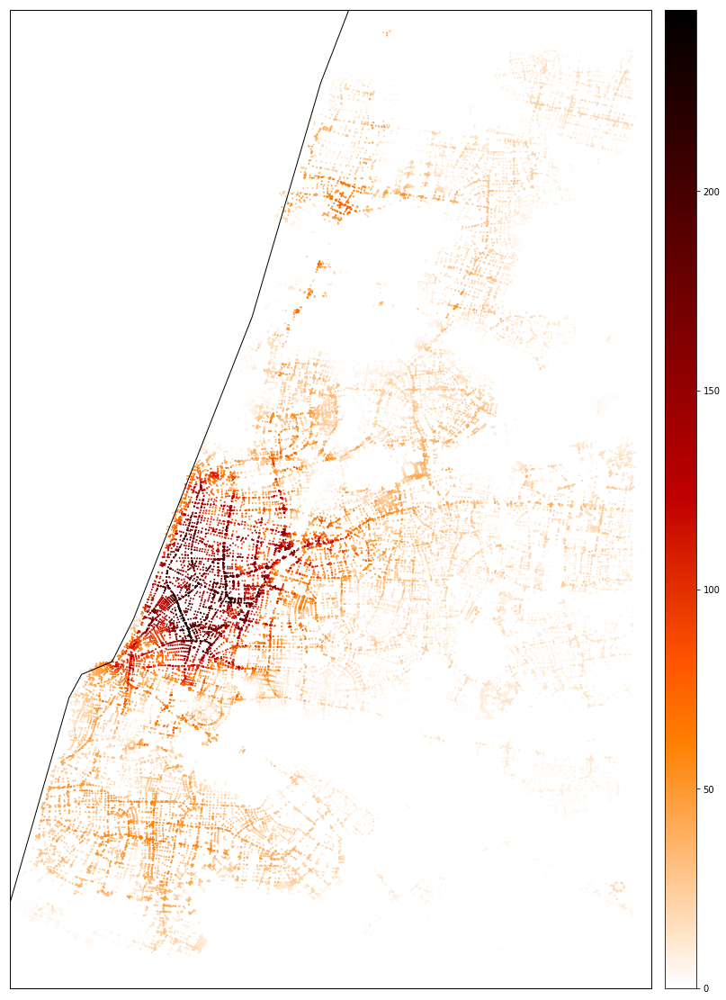

In [198]:
s_time = time.time()
transit_ped_net.plot(amens_15, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Amenities accessible within 30 minutes

Took 11.08 seconds


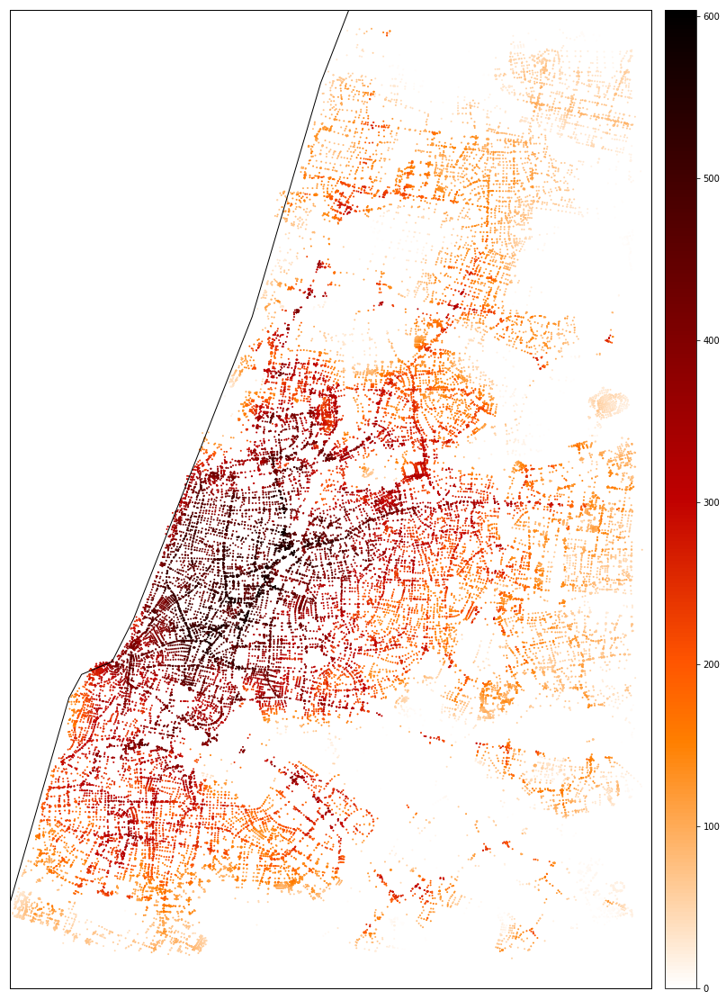

In [199]:
s_time = time.time()
transit_ped_net.plot(amens_30, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Amenities accessible within 45 minutes

Took 11.22 seconds


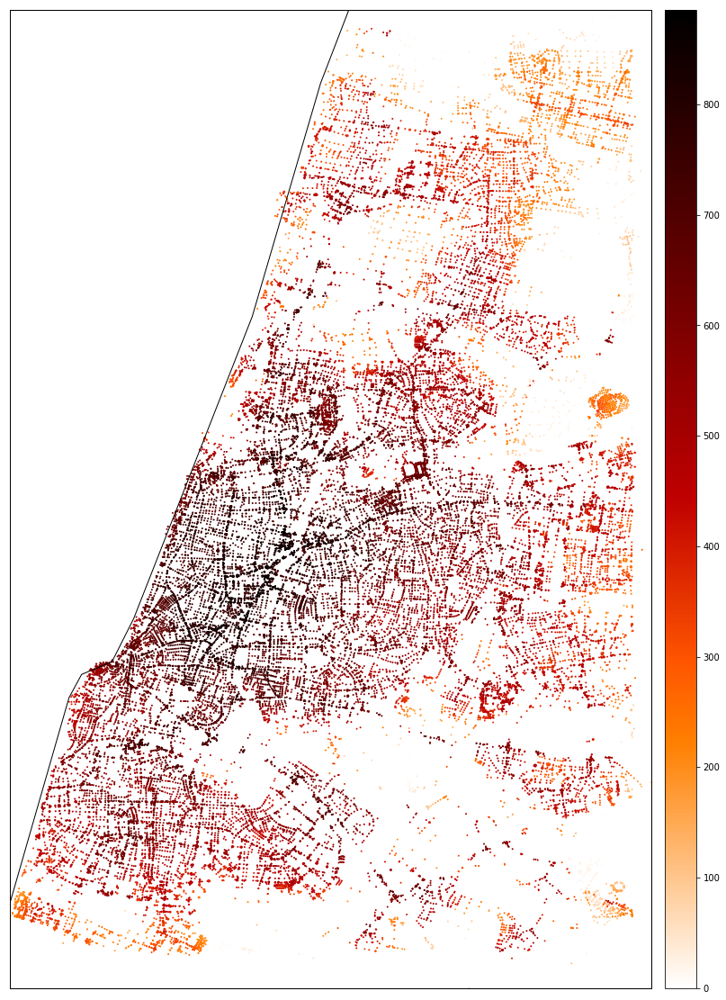

In [200]:
s_time = time.time()
transit_ped_net.plot(amens_45, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

# Add average headways to network travel time

### Calculate route stop level headways

The network we have generated so far only contains pure travel times. UrbanAccess allows for the calculation of and addition of route stop level average headways to the network. This is used as a proxy for passenger wait times at stops and stations. The route stop level average headway are added to the pedestrian to transit connector edges.

Let's calculate headways for the same AM Peak time period. Statistics on route stop level headways will be added to your GTFS transit data object inside of `headways`

In [201]:
ua.gtfs.headways.headways(gtfsfeeds_df=loaded_feeds,
                          headway_timerange=['07:00:00','10:00:00'])

Stop times from 07:00:00 to 10:00:00 successfully selected 508,000 records out of 2,545,552 total records (19.96 percent of total). Took 0.91 seconds
Starting route stop headway calculation for 21,514 route stops...
Route stop headway calculation complete. Took 76.75 seconds
headway calculation complete. Took 84.10 seconds


In [202]:
loaded_feeds.headways.head()

,count,mean,std,min,25%,50%,75%,max,unique_stop_id,unique_route_id,node_id_route
29981,11.0,5.818182,13.555945,0.0,0.0,0.0,0.0,41.0,12812_דן,16131_דן,12812_דן_16131_דן
30007,11.0,5.818182,13.555945,0.0,0.0,0.0,0.0,41.0,12812_דן,16131_דן,12812_דן_16131_דן
30033,11.0,5.818182,13.555945,0.0,0.0,0.0,0.0,41.0,12812_דן,16131_דן,12812_דן_16131_דן
30059,11.0,5.818182,13.555945,0.0,0.0,0.0,0.0,41.0,12812_דן,16131_דן,12812_דן_16131_דן
30085,11.0,5.818182,13.555945,0.0,0.0,0.0,0.0,41.0,12812_דן,16131_דן,12812_דן_16131_דן


### Add the route stop level average headways to your integrated network

Now that headways have been calculated and added to your GTFS transit feed object, you can use them to generate a new integrated network that incorporates the headways within the pedestrian to transit connector edge travel times.

In [203]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=True,
                             urbanaccess_gtfsfeeds_df=loaded_feeds,
                             headway_statistic='mean')

Loaded UrbanAccess network components comprised of:
     Transit: 5,733 nodes and 487,238 edges;
     OSM: 37,198 nodes and 110,414 edges
routes successfully joined to transit nodes. Took 0.88 seconds
Connector edges between the OSM and transit network nodes successfully completed. Took 6.95 seconds
mean route stop headway will be used for pedestrian to transit edge impedance.
Headway impedance calculation completed. Took 0.42 seconds
Fixed unicode error in name column
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 18.07 seconds
Network edge and node network integration completed successfully resulting in a total of 58,652 nodes and 1,126,356 edges:
     Transit: 21,454 nodes 487,238 edges;
     OSM: 37,198 nodes 110,414 edges; and
     OSM/Transit connector: 528,704 edges.


### Integrated network by travel time with average headways

Figure created. Took 187.54 seconds


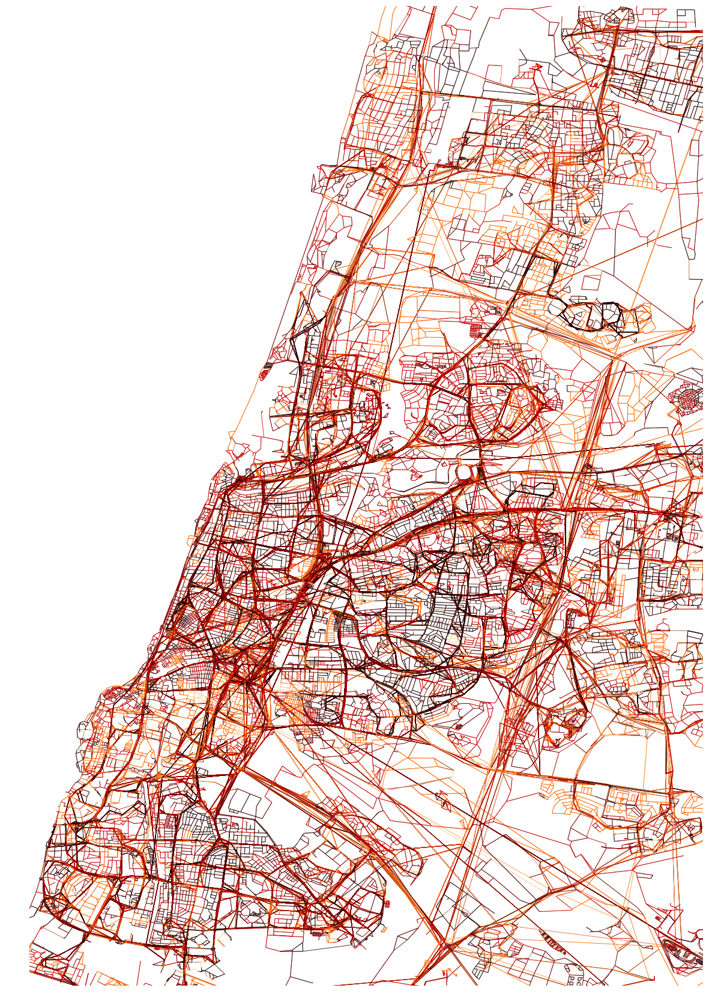

(<Figure size 1447.76x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x36237dd68>)

In [204]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

## Pandana again
This time using headway times. 

In [205]:
s_time = time.time()
transit_ped_net_headway = pdna.Network(urbanaccess_net.net_nodes["x"],
                               urbanaccess_net.net_nodes["y"],
                               urbanaccess_net.net_edges["from_int"],
                               urbanaccess_net.net_edges["to_int"],
                               urbanaccess_net.net_edges[["weight"]], 
                               twoway=False)
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 341.29 seconds


In [206]:
pois['node_id'] = transit_ped_net_headway.get_node_ids(pois['lon'], pois['lat'])

In [207]:
pois_gr = pois.groupby('node_id').size().reset_index()

In [208]:
pois_gr.loc[:,0].sum()

1473

In [209]:
transit_ped_net_headway.set(pois_gr.node_id, variable = pois_gr.loc[:,0], name='amens')

In [210]:
s_time = time.time()
amens_45_hw = transit_ped_net_headway.aggregate(45, type='sum', decay='linear', name='amens')
amens_30_hw = transit_ped_net_headway.aggregate(30, type='sum', decay='linear', name='amens')
amens_15_hw = transit_ped_net_headway.aggregate(15, type='sum', decay='linear', name='amens')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 897.55 seconds


In [211]:
print amens_45_hw.head()
print amens_30_hw.head()
print amens_15_hw.head()

id_int
1    673.092346
2    713.501770
3    727.859070
4    751.346558
5    747.469543
dtype: float32
id_int
1    376.065430
2    437.773987
3    436.070404
4    461.418640
5    447.102570
dtype: float32
id_int
1     51.966068
2    103.824936
3    105.917130
4    118.680801
5     92.725464
dtype: float32


### Amenities accessible within 15 minutes

Took 10.33 seconds


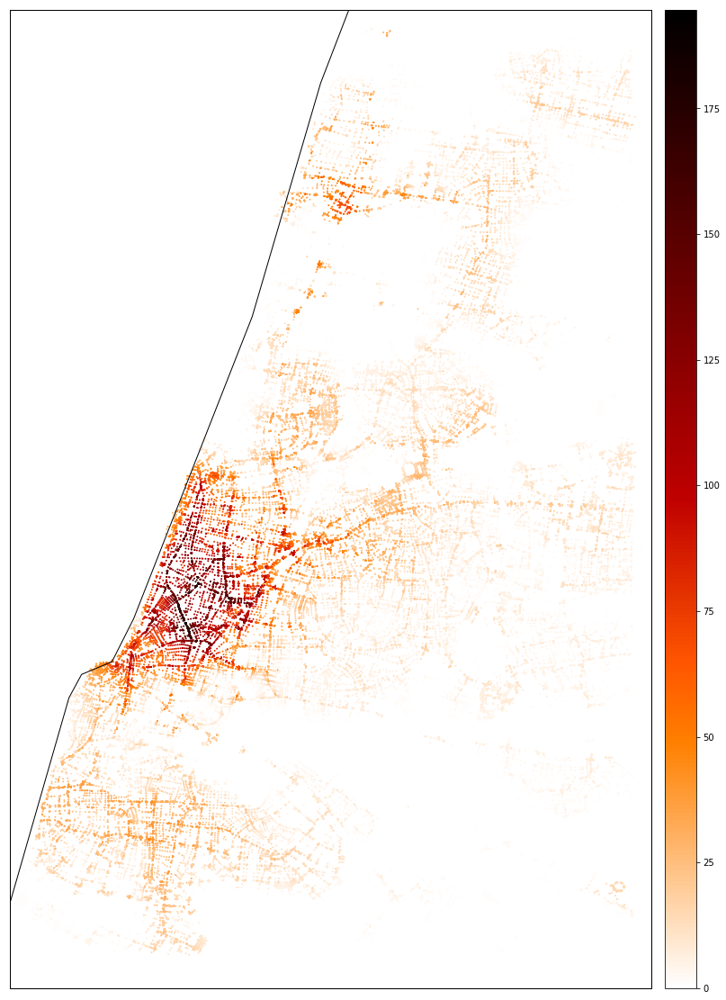

In [212]:
s_time = time.time()
transit_ped_net_headway.plot(amens_15_hw, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Amenities accessible within 30 minutes

Took 10.52 seconds


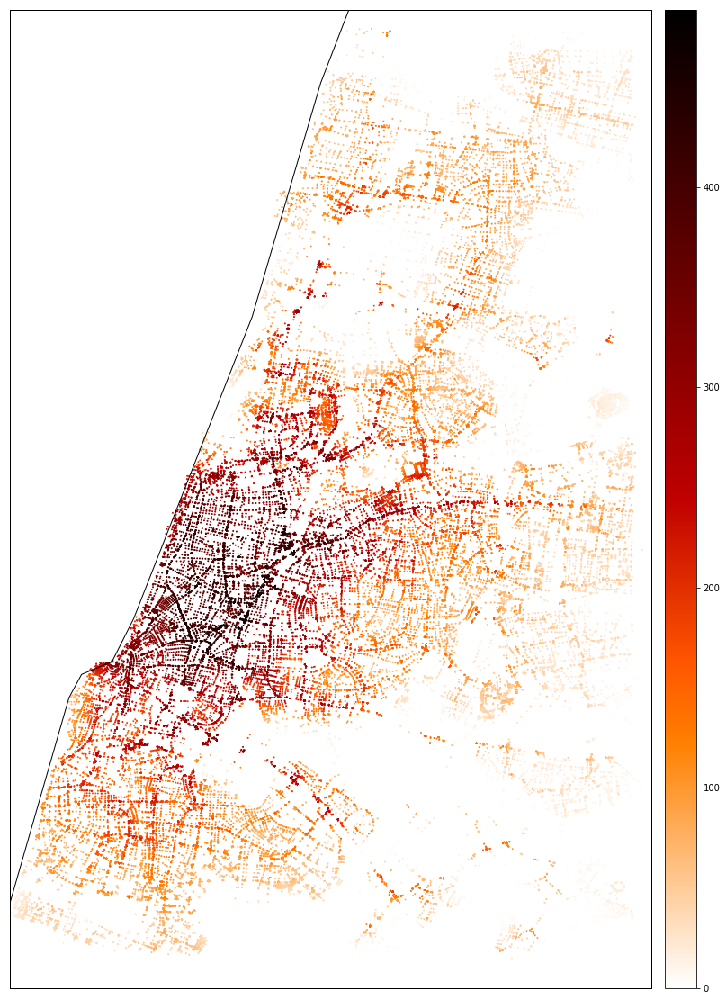

In [213]:
s_time = time.time()
transit_ped_net_headway.plot(amens_30_hw, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Amenities accessible within 45 minutes

Took 10.11 seconds


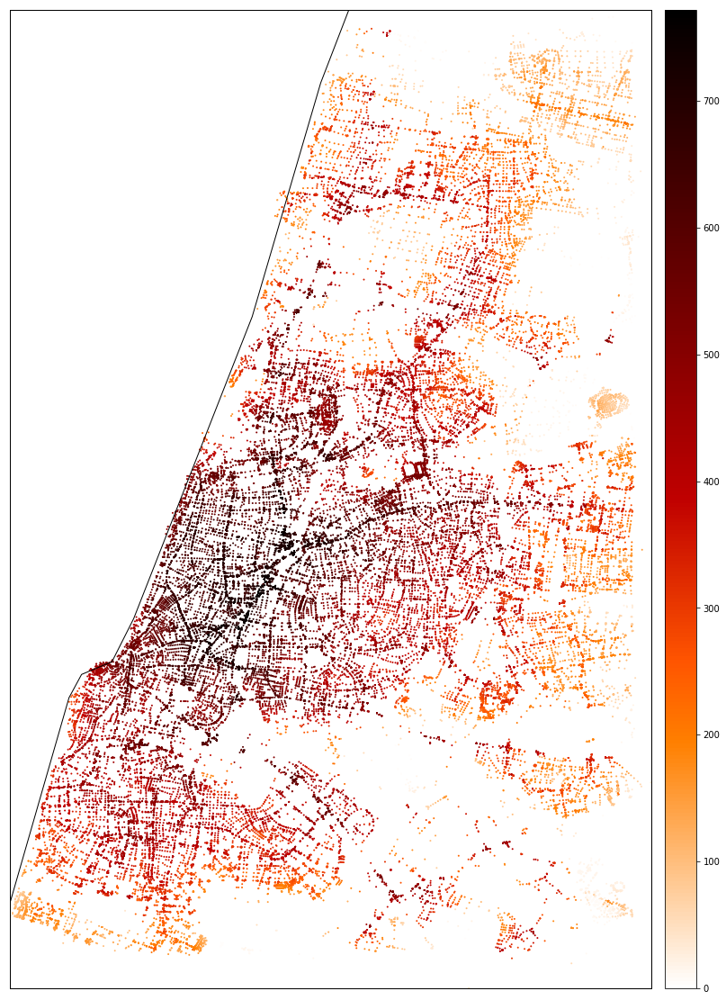

In [214]:
s_time = time.time()
transit_ped_net_headway.plot(amens_45_hw, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))